# What is Generic, what is specialized?

We will create a custom nxn matrix that depends on n paramaters, not $n^2$.  What should we be able to inherit from general linear algebra what should be specialized for this custom structure?  Truly good mathematical software thinks carefully about this very question.

In [4]:
using LinearAlgebra

Let's create a custom nxn matrix that depends on n paramaters, not $n^2$: <br>

C = diag(v) + v*v'

Here M.v will denote the parameters that M depends on. <br>
This is not a sparse matrix, but dense linear algebra clearly does not apply. Good programming is about taking advantage of structure.

# Build a Custom Type

In [5]:
## This would work, but we'll add a few fancy features
## struct Custom
##     v::Vector
## end

In [6]:
struct Custom{T} <: AbstractMatrix{T}
     v::Vector{T}
end

We added the type parameter {T} and the subtype AbstractMatrix.  The type parameters says that the vector could be made from any type: Int, Float, BigInt, Quaternion,... <br>

The subtype of AbstractMatrix automatically gives some functionality of size and getindex methods are defined as in the next cell.

In [7]:
Base.size(c::Custom)         =   length(c.v), length(c.v)
Base.getindex(c::Custom,i,j) =   c.v[i]*(i==j)  + c.v[i]*c.v[j]

In [8]:
C = Custom([1, 2, 3])

3×3 Custom{Int64}:
 2  2   3
 2  6   6
 3  6  12

In [9]:
M = Matrix(C)

3×3 Array{Int64,2}:
 2  2   3
 2  6   6
 3  6  12

Notice the different types. C would generally store n numbers, M would store $n^2$ numbers.

In [10]:
C * [1,2,3] # Matrix times vector automatically works though may not be efficient for large n.

3-element Array{Int64,1}:
 15
 32
 51

Why did this automatically work?  The subtyping as an AbstractMatrix and the definition of getindex and size is all that was needed.

In [11]:
# Matrix times vector with O(n) operations (3n multiplications , 2n additions)
Base.:*(c::Custom, x::Vector) = (c.v) .* x + c.v * (c.v'x)

In [12]:
C * [1,2,3] # same answer, now efficient

3-element Array{Int64,1}:
 15
 32
 51

# Compute the largest eigenvalue

Having any matrix times vector (efficient or not), is enough to get the largest singular value = largest eigenvalue using the Arnoldi method from Arpack (the Arnoldi package).

In [13]:
#using Pkg
#Pkg.add("Arpack")
using Arpack
svds(C,nsv=1)[1].S

1-element Array{Float64,1}:
 16.597761867267753

We can also use eigmax defined for Symmetric matrices.

In [14]:
S = Symmetric(M)
eigmax(S)

16.597761867267753

None of these are efficient on this structure.

# Eigmax Efficiently with Newton

With some linear algebra, we can see that $\det(Diag(v)+vv'-λI)=0$ is equivalent to 
$$ f(\lambda) = 1 + \sum_i \frac{v_i^2}{v_i-λ}=0.$$
The largest root $\lambda$ of the above nonlinear equation is the largest eigenvalue.

In [15]:
f(c::Custom)  = λ ->  1 + sum(c.v[i]^2 / (c.v[i] - λ)   for i=1:length(c.v))
f′(c::Custom) = λ ->      sum(c.v[i]^2 / (c.v[i] - λ)^2 for i=1:length(c.v))

f′ (generic function with 1 method)

In [16]:
function LinearAlgebra.eigmax(c::Custom; tol = eps(2.0), debug = false)
    x0 = maximum(c.v) + maximum(c.v)^2
    δ = f(c)(x0)/f′(c)(x0)
    while abs(δ) > x0 * tol               
        x0 -= δ
        δ = f(c)(x0)/f′(c)(x0) # Newton's Method
        debug && println("x = $x0, δ = $δ") # Debugging
    end
    x0
end

The function $f(λ)$ is concave on $(v_\max,\infty)$ and negative on $(v_\max,\lambda_\max)$.
Thus if we start Newton's method on $(v_\max,\lambda_\max)$, we are guaranteed to converge monotonically to the largest eigenvalue.  It is easy to see that $v_\max + v_\max^2$ is in this interval, so it seems like a good place to start the iteration.

# Compare Timings

In [17]:
v = randn(3000)
C = Custom(v)
M = Matrix(C)
S = Symmetric(M);

In [18]:
@time eigmax(S) # Special Symmetric eigenmax

  2.639851 seconds (15.80 k allocations: 70.547 MiB, 1.97% gc time)


3071.604810086825

In [19]:
@time maximum(eigvals(M)) # Vanilla LAPACK solver just a bit slower

  2.917261 seconds (397.67 k allocations: 88.816 MiB, 2.25% gc time)


3071.604810086825

In [20]:
@time eigmax(C) # run twice, no comparison

  0.082577 seconds (252.30 k allocations: 12.563 MiB)


3071.604810086832

# A Closer Look at Newton

In [37]:
eigmax(C, debug=true)

x = 26.73979930411068, δ = -26.302674755734234
x = 53.04247405984491, δ = -51.98943636464943
x = 105.03191042449434, δ = -101.21501109300264
x = 206.246921517497, δ = -191.6610848677974
x = 397.90800638529436, δ = -343.66201617106094
x = 741.5700225563553, δ = -553.1641821681568
x = 1294.734204724512, δ = -720.4107844531649
x = 2015.144989177677, δ = -623.8806016988657
x = 2639.0255908765425, δ = -252.94795455285268
x = 2891.973545429395, δ = -26.568525537613283
x = 2918.5420709670084, δ = -0.24632614374793893
x = 2918.7883971107563, δ = -2.0791700561970276e-5
x = 2918.788417902457, δ = -5.184831732136515e-12
x = 2918.788417902462, δ = 9.721559497756013e-13


2918.788417902462

In [22]:
using Plots
pyplot()

Plots.PyPlotBackend()

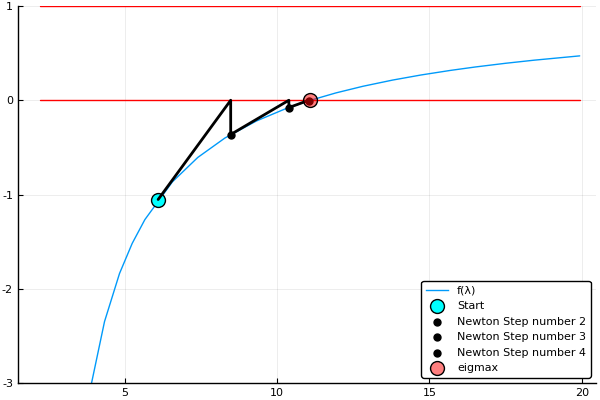

In [51]:
n=5
v = randn(n)
C = Custom(v)

xmin = maximum(v)
xmax = 2*eigmax(C) - xmin

plot(f(C),xmin,xmax, ylim=(-3,1), label="f(λ)")
plot!(x->0,xmin,xmax,color=:red, label="")
plot!(x->1,xmin,xmax, color=:red, label="")


x = xmin + xmin^2 
scatter!([x],[f(C)(x)],color=:cyan, label="Start", markersize=10)
for k=2:4
    xold = x
    x -= f(C)(x)/f′(C)(x) 
    plot!([xold,  x, x],[f(C)(xold), 0, f(C)(x)],width=2,color=:black,label="")
    scatter!([x],[f(C)(x)],color=:black,markersize=5,label="Newton Step number $k")
end
scatter!([eigmax(C)],[0.0],color=:red,markersize=10,label="eigmax",alpha=.5)